In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder,MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, log_loss
import operator
import json
from IPython import display
import os
import warnings

np.random.seed(0)
warnings.filterwarnings("ignore")
THRESHOLD = 4

Task: To predict whether the user likes the mobile phone or not.   
Assumption: If the average rating of mobile >= threshold, then the user likes it, otherwise not.

Missing values:
'Also Known As'(459),'Applications'(421),'Audio Features'(437),'Bezel-less display'(266),'Browser'(449),'Build Material'(338),'Co-Processor'(451),'Display Colour'(457),'Mobile High-Definition Link(MHL)'(472),'Music'(447) 'Email','Fingerprint Sensor Position'(174),'Games'(446),'HDMI'(454),'Heart Rate Monitor'(467),'IRIS Scanner'(467), 'Optical Image Stabilisation'(219),'Other Facilities'(444),'Phone Book'(444),'Physical Aperture'(87),'Quick Charging'(122),'Ring Tone'(444),'Ruggedness'(430),SAR Value(315),'SIM 3'(472),'SMS'(470)', 'Screen Protection'(229),'Screen to Body Ratio (claimed by the brand)'(428),'Sensor'(242),'Software Based Aperture'(473), 'Special Features'(459),'Standby time'(334),'Stylus'(473),'TalkTime'(259), 'USB Type-C'(374),'Video Player'(456), 'Video Recording Features'(458),'Waterproof'(398),'Wireless Charging','USB OTG Support'(159), 'Video ,'Recording'(113),'Java'(471),'Browser'(448)

Very low variance:
'Architecture'(most entries are 64-bit),'Audio Jack','GPS','Loudspeaker','Network','Network Support','Other Sensors'(28),'SIM Size', 'VoLTE'

Multivalued:
'Colours','Custom UI','Model'(1),'Other Sensors','Launch Date'

Not important:
'Bluetooth', 'Settings'(75),'Wi-Fi','Wi-Fi Features'

Doubtful:
'Aspect Ratio','Autofocus','Brand','Camera Features','Fingerprint Sensor'(very few entries are missing), 'Fingerprint Sensor Position', 'Graphics'(multivalued),'Image resolution'(multivalued),'SIM Size','Sim Slot(s)', 'User Available Storage', 'SIM 1', 'SIM 2','Shooting Modes', 'Touch Screen'(24), 'USB Connectivity'

To check:
'Display Type','Expandable Memory','FM Radio'

High Correlation with other features
'SIM Slot(s)' high correlation with SIM1 'Weight' has high high correlation with capacity , screen-to-body ratio 'Height' - screen size is also there

Given a mobile, we can't directly get these features
'Rating Count', 'Review Count'

Keeping:
'Capacity','Flash'(17),'Height'(22),'Internal Memory'(20, require cleaning),'Operating System'(25, require cleaning), 'Pixel Density'(1, clean it),'Processor'(22, clean it), 'RAM'(17, clean), 'Rating','Resolution'(cleaning), 'Screen Resolution','Screen Size', 'Thickness'(22), 'Type','User Replaceable','Weight'(cleaning),'Sim Size'(), 'Other Sensors'(28), 'Screen to Body Ratio (calculated)','Width',

In [3]:
train = pd.read_csv('./Dataset/train.csv')
test= pd.read_csv('./Dataset/test.csv')

In [4]:
# check the number of features and data points in train
print("Number of data points in train: %d" % train.shape[0])
print("Number of features in train: %d" % train.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test.shape[0])
print("Number of features in test: %d" % test.shape[1])

Number of data points in train: 355
Number of features in train: 99
Number of data points in test: 119
Number of features in test: 98


In [5]:
def data_clean(data):
    
    # Let's first remove all missing value features
    columns_to_remove = ['Also Known As','Applications','Audio Features','Bezel-less display'
                         'Browser','Build Material','Co-Processor','Browser'
                         'Display Colour','Mobile High-Definition Link(MHL)',
                         'Music', 'Email','Fingerprint Sensor Position',
                         'Games','HDMI','Heart Rate Monitor','IRIS Scanner', 
                         'Optical Image Stabilisation','Other Facilities',
                         'Phone Book','Physical Aperture','Quick Charging',
                         'Ring Tone','Ruggedness','SAR Value','SIM 3','SMS',
                         'Screen Protection','Screen to Body Ratio (claimed by the brand)',
                         'Sensor','Software Based Aperture', 'Special Features',
                         'Standby time','Stylus','TalkTime', 'USB Type-C',
                         'Video Player', 'Video Recording Features','Waterproof',
                         'Wireless Charging','USB OTG Support', 'Video Recording','Java']

    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]

    #Features having very low variance 
    columns_to_remove = ['Architecture','Audio Jack','GPS','Loudspeaker','Network','Network Support','VoLTE']
    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]

    # Multivalued:
    columns_to_remove = ['Architecture','Launch Date','Audio Jack','GPS','Loudspeaker','Network','Network Support','VoLTE', 'Custom UI']
    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]

    # Not much important
    columns_to_remove = ['Bluetooth', 'Settings','Wi-Fi','Wi-Fi Features']
    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]
    
    return data

# Removing feature

Before cleaning the data

In [6]:
print(train.columns)

Index(['PhoneId', 'Also Known As', 'Applications', 'Architecture',
       'Aspect Ratio', 'Audio Features', 'Audio Jack', 'Autofocus',
       'Bezel-less display', 'Bluetooth', 'Brand', 'Browser', 'Build Material',
       'Camera Features', 'Capacity', 'Chipset', 'Co-Processor', 'Colours',
       'Custom UI', 'Display Colour', 'Display Type', 'Email',
       'Expandable Memory', 'FM Radio', 'Fingerprint Sensor',
       'Fingerprint Sensor Position', 'Flash', 'GPS', 'Games', 'Graphics',
       'HDMI', 'Heart Rate Monitor', 'Height', 'IRIS Scanner',
       'Image Resolution', 'Internal Memory', 'Java', 'Launch Date',
       'Loudspeaker', 'Mobile High-Definition Link(MHL)', 'Model', 'Music',
       'NFC', 'Network', 'Network Support', 'Operating System',
       'Optical Image Stabilisation', 'Other Facilities', 'Other Sensors',
       'Phone Book', 'Physical Aperture', 'Pixel Density', 'Processor',
       'Quick Charging', 'RAM', 'Rating Count', 'Resolution', 'Review Count',
       'Ring

In [7]:
train = data_clean(train)
test = data_clean(test)

After cleaning Data

In [8]:
print(train.columns)

Index(['PhoneId', 'Camera Features', 'Height', 'Model', 'FM Radio',
       'Screen to Body Ratio (calculated)', 'RAM', 'Shooting Modes',
       'Other Sensors', 'User Replaceable', 'Rating', 'User Available Storage',
       'SIM Slot(s)', 'Type', 'Chipset', 'Width', 'Thickness',
       'USB Connectivity', 'Display Colour', 'Bezel-less display', 'NFC',
       'Display Type', 'Internal Memory', 'Operating System', 'SIM 1',
       'Rating Count', 'SIM Size', 'Fingerprint Sensor', 'Screen Size',
       'Brand', 'Image Resolution', 'Review Count', 'Autofocus', 'Graphics',
       'Expandable Memory', 'Screen Resolution', 'Browser', 'Flash',
       'Resolution', 'Pixel Density', 'Capacity', 'SIM 2', 'Touch Screen',
       'Weight', 'Colours', 'Processor', 'Aspect Ratio'],
      dtype='object')


In [9]:
train = train[(train.isnull().sum(axis=1) <= 15)]
# You shouldn't remove data points from test set
#test = test[(test.isnull().sum(axis=1) <= 15)]

In [10]:
# check the number of features and data points in train
print("Number of data points in train: %d" % train.shape[0])
print("Number of features in train: %d" % train.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test.shape[0])
print("Number of features in test: %d" % test.shape[1])

Number of data points in train: 341
Number of features in train: 47
Number of data points in test: 119
Number of features in test: 46


In [11]:
train.head()

,PhoneId,Camera Features,Height,Model,FM Radio,Screen to Body Ratio (calculated),RAM,Shooting Modes,Other Sensors,User Replaceable,...,Flash,Resolution,Pixel Density,Capacity,SIM 2,Touch Screen,Weight,Colours,Processor,Aspect Ratio
0,0,"Digital Zoom, Auto Flash, Face detection, Touc...",157.9 mm Compare Size,Redmi Note 6 Pro,NaN,80.68 %,4 GB Excellent ▾RAM compared to11 - 17 K Phone...,"Continuos Shooting, High Dynamic Range mode (H...","Light sensor, Proximity sensor, Accelerometer,...",No,...,Dual-color LED Flash,20 MP + 2 MP Dual Front Cameras Best in Class ...,403 ppi Best in Class ▾Pixel Density compared ...,4000 mAh,4G Bands: TD-LTE 2300(band 40) / 2500(band 41)...,"Capacitive Touchscreen, Multi-touch",182 grams Below Average ▾Weight compared to11 ...,"Black, Blue, Red, Rose Gold","Octa core (1.8 GHz, Quad core, Kryo 260 + 1.6 ...",19:9
1,1,"2 x Digital Zoom, Auto Flash, Face detection, ...",156.2 mm Compare Size,2,NaN,80.85 %,3 GB Excellent ▾RAM compared to8 - 12 K Phones...,"Continuos Shooting, High Dynamic Range mode (HDR)","Light sensor, Proximity sensor, Accelerometer,...",No,...,LED Flash,8 MP Front Camera Very Good ▾Front Camera comp...,271 ppi Good ▾Pixel Density compared to8 - 12 ...,4230 mAh,4G Bands: TD-LTE 2600(band 38) / 2300(band 40)...,"Capacitive Touchscreen, Multi-touch",168 grams Average ▾Weight compared to8 - 12 K ...,"Diamond Black, Diamond Blue, Diamond Red","Octa core, 1.8 GHz, Cortex A53 Average ▾Proces...",19:9
2,2,"2 x Digital Zoom, Auto Flash, Face detection, ...",157 mm Compare Size,U1,yes,83.68 %,3 GB Excellent ▾RAM compared to10 - 14 K Phone...,"Continuos Shooting, High Dynamic Range mode (HDR)","Light sensor, Proximity sensor, Accelerometer",No,...,LED Flash,25 MP Front Camera Best in Class ▾Front Camera...,409 ppi Best in Class ▾Pixel Density compared ...,3500 mAh,4G Bands: TD-LTE 2600(band 38) / 2300(band 40)...,"Capacitive Touchscreen, Multi-touch",168 grams Average ▾Weight compared to10 - 14 K...,"Brave Blue, Fiery Gold, Ambitious Black","Octa core (2.1 GHz, Quad core, Cortex A73 + 2 ...",19.5:9
3,4,"Digital Zoom, Auto Flash, Face detection, Touc...",159.8 mm Compare Size,Galaxy A7 2018,yes,74.78 %,4 GB Excellent ▾RAM compared to15 - 23 K Phone...,"Continuos Shooting, High Dynamic Range mode (HDR)","Light sensor, Proximity sensor, Accelerometer,...",No,...,LED Flash,24 MP Front Camera Best in Class ▾Front Camera...,411 ppi Best in Class ▾Pixel Density compared ...,3300 mAh,4G Bands: TD-LTE 2600(band 38) / 2300(band 40)...,"Capacitive Touchscreen, Multi-touch",169 grams Average ▾Weight compared to15 - 23 K...,"Black, Blue, Gold","Octa core (2.2 GHz, Dual core, Cortex A73 + 1....",18.5:9
4,5,"Digital Zoom, Auto Flash, Face detection, Touc...",160.4 mm Compare Size,8X,yes,84.23 %,4 GB Excellent ▾RAM compared to12 - 18 K Phone...,"Continuos Shooting, High Dynamic Range mode (HDR)","Light sensor, Proximity sensor, Accelerometer,...",No,...,LED Flash,16 MP Front Camera Excellent ▾Front Camera com...,396 ppi Best in Class ▾Pixel Density compared ...,3750 mAh,4G Bands: TD-LTE 2300(band 40) FD-LTE 1800(ban...,"Capacitive Touchscreen, Multi-touch",175 grams Below Average ▾Weight compared to12 ...,"Black, Blue, Red","Octa core (2.2 GHz, Quad core, Cortex A73 + 1....",19.5:9


# Filling Missing Values

In [12]:
def for_integer(test):
    try:
        test = test.strip()
        return int(test.split(' ')[0])
    except IOError:
           pass
    except ValueError:
        pass
    except:
        pass

def for_string(test):
    try:
        test = test.strip()
        return (test.split(' ')[0])
    except IOError:
        pass
    except ValueError:
        pass
    except:
        pass

def for_float(test):
    try:
        test = test.strip()
        return float(test.split(' ')[0])
    except IOError:
        pass
    except ValueError:
        pass
    except:
        pass
def find_freq(test):
    try:
        test = test.strip()
        test = test.split(' ')
        if test[2][0] == '(':
            return float(test[2][1:])
        return float(test[2])
    except IOError:
        pass
    except ValueError:
        pass
    except:
        pass

    
def for_Internal_Memory(test):
    try:
        test = test.strip()
        test = test.split(' ')
        if test[1] == 'GB':
            return int(test[0])
        if test[1] == 'MB':
#             print("here")
            return (int(test[0]) * 0.001)
    except IOError:
           pass
    except ValueError:
        pass
    except:
        pass
    
def find_freq(test):
    try:
        test = test.strip()
        test = test.split(' ')
        if test[2][0] == '(':
            return float(test[2][1:])
        return float(test[2])
    except IOError:
        pass
    except ValueError:
        pass
    except:
        pass


In [13]:
def data_clean_2(x):
    data = x.copy()
    
    data['Capacity'] = data['Capacity'].apply(for_integer)

    data['Height'] = data['Height'].apply(for_float)
    data['Height'] = data['Height'].fillna(data['Height'].mean())

    data['Internal Memory'] = data['Internal Memory'].apply(for_Internal_Memory)

    data['Pixel Density'] = data['Pixel Density'].apply(for_integer)

    data['Internal Memory'] = data['Internal Memory'].fillna(data['Internal Memory'].median())
    data['Internal Memory'] = data['Internal Memory'].astype(int)

    data['RAM'] = data['RAM'].apply(for_Internal_Memory)
    data['RAM'] = data['RAM'].fillna(data['RAM'].median())
    data['RAM'] = data['RAM'].astype(int)

    data['Resolution'] = data['Resolution'].apply(for_integer)
    data['Resolution'] = data['Resolution'].fillna(data['Resolution'].median())
    data['Resolution'] = data['Resolution'].astype(int)

    data['Screen Size'] = data['Screen Size'].apply(for_float)

    data['Thickness'] = data['Thickness'].apply(for_float)
    data['Thickness'] = data['Thickness'].fillna(data['Thickness'].mean())
    data['Thickness'] = data['Thickness'].round(2)

    data['Type'] = data['Type'].fillna('Li-Polymer')

    data['Screen to Body Ratio (calculated)'] = data['Screen to Body Ratio (calculated)'].apply(for_float)
    data['Screen to Body Ratio (calculated)'] = data['Screen to Body Ratio (calculated)'].fillna(data['Screen to Body Ratio (calculated)'].mean())
    data['Screen to Body Ratio (calculated)'] = data['Screen to Body Ratio (calculated)'].round(2)

    data['Width'] = data['Width'].apply(for_float)
    data['Width'] = data['Width'].fillna(data['Width'].mean())
    data['Width'] = data['Width'].round(2)

    data['Flash'][data['Flash'].isna() == True] = "Other"

    data['User Replaceable'][data['User Replaceable'].isna() == True] = "Other"

    data['Num_cores'] = data['Processor'].apply(for_string)
    data['Num_cores'][data['Num_cores'].isna() == True] = "Other"


    data['Processor_frequency'] = data['Processor'].apply(find_freq)
    #because there is one entry with 208MHz values, to convert it to GHz
    data['Processor_frequency'][data['Processor_frequency'] > 200] = 0.208
    data['Processor_frequency'] = data['Processor_frequency'].fillna(data['Processor_frequency'].mean())
    data['Processor_frequency'] = data['Processor_frequency'].round(2)

    data['Camera Features'][data['Camera Features'].isna() == True] = "Other"

    #simplifyig Operating System to os_name for simplicity
    data['os_name'] = data['Operating System'].apply(for_string)
    data['os_name'][data['os_name'].isna() == True] = "Other"

    data['Sim1'] = data['SIM 1'].apply(for_string)

    data['SIM Size'][data['SIM Size'].isna() == True] = "Other"

    data['Image Resolution'][data['Image Resolution'].isna() == True] = "Other"

    data['Fingerprint Sensor'][data['Fingerprint Sensor'].isna() == True] = "Other"

    data['Expandable Memory'][data['Expandable Memory'].isna() == True] = "No"

    data['Weight'] = data['Weight'].apply(for_integer)
    data['Weight'] = data['Weight'].fillna(data['Weight'].mean())
    data['Weight'] = data['Weight'].astype(int)

    data['SIM 2'] = data['SIM 2'].apply(for_string)
    data['SIM 2'][data['SIM 2'].isna() == True] = "Other"
    
    return data

In [14]:
train = data_clean_2(train)
test = data_clean_2(test)

In [15]:
# check the number of features and data points in train
print("Number of data points in train: %d" % train.shape[0])
print("Number of features in train: %d" % train.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test.shape[0])
print("Number of features in test: %d" % test.shape[1])

Number of data points in train: 341
Number of features in train: 51
Number of data points in test: 119
Number of features in test: 50


In [16]:
train.columns

Index(['PhoneId', 'Camera Features', 'Height', 'Model', 'FM Radio',
       'Screen to Body Ratio (calculated)', 'RAM', 'Shooting Modes',
       'Other Sensors', 'User Replaceable', 'Rating', 'User Available Storage',
       'SIM Slot(s)', 'Type', 'Chipset', 'Width', 'Thickness',
       'USB Connectivity', 'Display Colour', 'Bezel-less display', 'NFC',
       'Display Type', 'Internal Memory', 'Operating System', 'SIM 1',
       'Rating Count', 'SIM Size', 'Fingerprint Sensor', 'Screen Size',
       'Brand', 'Image Resolution', 'Review Count', 'Autofocus', 'Graphics',
       'Expandable Memory', 'Screen Resolution', 'Browser', 'Flash',
       'Resolution', 'Pixel Density', 'Capacity', 'SIM 2', 'Touch Screen',
       'Weight', 'Colours', 'Processor', 'Aspect Ratio', 'Num_cores',
       'Processor_frequency', 'os_name', 'Sim1'],
      dtype='object')

In [17]:
train.head()

,PhoneId,Camera Features,Height,Model,FM Radio,Screen to Body Ratio (calculated),RAM,Shooting Modes,Other Sensors,User Replaceable,...,SIM 2,Touch Screen,Weight,Colours,Processor,Aspect Ratio,Num_cores,Processor_frequency,os_name,Sim1
0,0,"Digital Zoom, Auto Flash, Face detection, Touc...",157.9,Redmi Note 6 Pro,NaN,80.68,4,"Continuos Shooting, High Dynamic Range mode (H...","Light sensor, Proximity sensor, Accelerometer,...",No,...,4G,"Capacitive Touchscreen, Multi-touch",182,"Black, Blue, Red, Rose Gold","Octa core (1.8 GHz, Quad core, Kryo 260 + 1.6 ...",19:9,Octa,1.8,Android,4G
1,1,"2 x Digital Zoom, Auto Flash, Face detection, ...",156.2,2,NaN,80.85,3,"Continuos Shooting, High Dynamic Range mode (HDR)","Light sensor, Proximity sensor, Accelerometer,...",No,...,4G,"Capacitive Touchscreen, Multi-touch",168,"Diamond Black, Diamond Blue, Diamond Red","Octa core, 1.8 GHz, Cortex A53 Average ▾Proces...",19:9,Octa,1.8,Android,4G
2,2,"2 x Digital Zoom, Auto Flash, Face detection, ...",157.0,U1,yes,83.68,3,"Continuos Shooting, High Dynamic Range mode (HDR)","Light sensor, Proximity sensor, Accelerometer",No,...,4G,"Capacitive Touchscreen, Multi-touch",168,"Brave Blue, Fiery Gold, Ambitious Black","Octa core (2.1 GHz, Quad core, Cortex A73 + 2 ...",19.5:9,Octa,2.1,Android,4G
3,4,"Digital Zoom, Auto Flash, Face detection, Touc...",159.8,Galaxy A7 2018,yes,74.78,4,"Continuos Shooting, High Dynamic Range mode (HDR)","Light sensor, Proximity sensor, Accelerometer,...",No,...,4G,"Capacitive Touchscreen, Multi-touch",169,"Black, Blue, Gold","Octa core (2.2 GHz, Dual core, Cortex A73 + 1....",18.5:9,Octa,2.2,Android,4G
4,5,"Digital Zoom, Auto Flash, Face detection, Touc...",160.4,8X,yes,84.23,4,"Continuos Shooting, High Dynamic Range mode (HDR)","Light sensor, Proximity sensor, Accelerometer,...",No,...,4G,"Capacitive Touchscreen, Multi-touch",175,"Black, Blue, Red","Octa core (2.2 GHz, Quad core, Cortex A73 + 1....",19.5:9,Octa,2.2,Android,4G


In [18]:
def data_clean_3(x):
    
    data = x.copy()

    columns_to_remove = ['User Available Storage','SIM Size','Chipset','Processor','Autofocus','Aspect Ratio','Touch Screen',
                        'Bezel-less display','Operating System','SIM 1','USB Connectivity','Other Sensors','Graphics','FM Radio',
                        'NFC','Shooting Modes','Browser','Display Colour' ]

    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]


    columns_to_remove = [ 'Screen Resolution','User Replaceable','Camera Features',
                        'Thickness', 'Display Type']

    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]


    columns_to_remove = ['Fingerprint Sensor', 'Flash', 'Rating Count', 'Review Count','Image Resolution','Type','Expandable Memory',\
                        'Colours','Width','Model']
    columns_to_retain = list(set(data.columns)-set(columns_to_remove))
    data = data[columns_to_retain]

    return data

In [19]:
train = data_clean_3(train)
test = data_clean_3(test)

# check the number of features and data points in train
print("Number of data points in train: %d" % train.shape[0])
print("Number of features in train: %d" % train.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test.shape[0])
print("Number of features in test: %d" % test.shape[1])

Number of data points in train: 341
Number of features in train: 18
Number of data points in test: 119
Number of features in test: 17


In [20]:
train.columns

Index(['Internal Memory', 'PhoneId', 'SIM Slot(s)', 'Height', 'Num_cores',
       'Sim1', 'Pixel Density', 'Screen Size', 'Brand',
       'Screen to Body Ratio (calculated)', 'os_name', 'RAM', 'Capacity',
       'SIM 2', 'Weight', 'Rating', 'Processor_frequency', 'Resolution'],
      dtype='object')

In [21]:
# one hot encoding

train_ids = train['PhoneId']
test_ids = test['PhoneId']

cols = list(test.columns)
cols.remove('PhoneId')
cols.insert(0, 'PhoneId')

combined = pd.concat([train.drop('Rating', axis=1)[cols], test[cols]])
print(combined.shape)
print(combined.columns)

combined = pd.get_dummies(combined)
print(combined.shape)
print(combined.columns)

train_new = combined[combined['PhoneId'].isin(train_ids)]
test_new = combined[combined['PhoneId'].isin(test_ids)]

(460, 17)
Index(['PhoneId', 'Internal Memory', 'SIM Slot(s)', 'Height', 'Num_cores',
       'Sim1', 'Pixel Density', 'Screen Size', 'Brand',
       'Screen to Body Ratio (calculated)', 'os_name', 'RAM', 'Capacity',
       'SIM 2', 'Weight', 'Processor_frequency', 'Resolution'],
      dtype='object')
(460, 87)
Index(['PhoneId', 'Internal Memory', 'Height', 'Pixel Density', 'Screen Size',
       'Screen to Body Ratio (calculated)', 'RAM', 'Capacity', 'Weight',
       'Processor_frequency', 'Resolution', 'SIM Slot(s)_Dual SIM, GSM+CDMA',
       'SIM Slot(s)_Dual SIM, GSM+GSM',
       'SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE',
       'SIM Slot(s)_Single SIM, GSM', 'Num_cores_312', 'Num_cores_Deca',
       'Num_cores_Dual', 'Num_cores_Hexa', 'Num_cores_Octa', 'Num_cores_Other',
       'Num_cores_Quad', 'Num_cores_Tru-Octa', 'Sim1_2G', 'Sim1_3G', 'Sim1_4G',
       'Brand_10.or', 'Brand_Apple', 'Brand_Asus', 'Brand_Billion',
       'Brand_Blackberry', 'Brand_Comio', 'Brand_Coolpad', 'Brand_

In [22]:
train_new.head()

,PhoneId,Internal Memory,Height,Pixel Density,Screen Size,Screen to Body Ratio (calculated),RAM,Capacity,Weight,Processor_frequency,...,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other
0,0,64,157.9,403,6.26,80.68,4,4000,182,1.8,...,0,0,0,0,0,0,0,0,1,0
1,1,32,156.2,271,6.20,80.85,3,4230,168,1.8,...,0,0,0,0,0,0,0,0,1,0
2,2,32,157.0,409,6.30,83.68,3,3500,168,2.1,...,0,0,0,0,0,0,0,0,1,0
3,4,64,159.8,411,6.00,74.78,4,3300,169,2.2,...,0,0,0,0,0,0,0,0,1,0
4,5,64,160.4,396,6.50,84.23,4,3750,175,2.2,...,0,0,0,0,0,0,0,0,1,0


In [23]:
train_new = train_new.merge(train[['PhoneId', 'Rating']], on='PhoneId')

In [24]:
train_new.head()

,PhoneId,Internal Memory,Height,Pixel Density,Screen Size,Screen to Body Ratio (calculated),RAM,Capacity,Weight,Processor_frequency,...,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Rating
0,0,64,157.9,403,6.26,80.68,4,4000,182,1.8,...,0,0,0,0,0,0,0,1,0,4.5
1,1,32,156.2,271,6.20,80.85,3,4230,168,1.8,...,0,0,0,0,0,0,0,1,0,4.5
2,2,32,157.0,409,6.30,83.68,3,3500,168,2.1,...,0,0,0,0,0,0,0,1,0,4.4
3,4,64,159.8,411,6.00,74.78,4,3300,169,2.2,...,0,0,0,0,0,0,0,1,0,4.3
4,5,64,160.4,396,6.50,84.23,4,3750,175,2.2,...,0,0,0,0,0,0,0,1,0,4.4


In [25]:
# check the number of features and data points in train
print("Number of data points in train: %d" % train_new.shape[0])
print("Number of features in train: %d" % train_new.shape[1])

# check the number of features and data points in test
print("Number of data points in test: %d" % test_new.shape[0])
print("Number of features in test: %d" % test_new.shape[1])

Number of data points in train: 341
Number of features in train: 88
Number of data points in test: 119
Number of features in test: 87


In [26]:
#pd.set_option('display.height',1000)
pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',100)
pd.set_option('display.width',1000)
train_new.head()

,PhoneId,Internal Memory,Height,Pixel Density,Screen Size,Screen to Body Ratio (calculated),RAM,Capacity,Weight,Processor_frequency,Resolution,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,Sim1_2G,Sim1_3G,Sim1_4G,Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Rating
0,0,64,157.9,403,6.26,80.68,4,4000,182,1.8,20,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,4.5
1,1,32,156.2,271,6.20,80.85,3,4230,168,1.8,8,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,4.5
2,2,32,157.0,409,6.30,83.68,3,3500,168,2.1,25,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,4.4
3,4,64,159.8,411,6.00,74.78,4,3300,169,2.2,24,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,4.3
4,5,64,160.4,396,6.50,84.23,4,3750,175,2.2,16,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,4.4


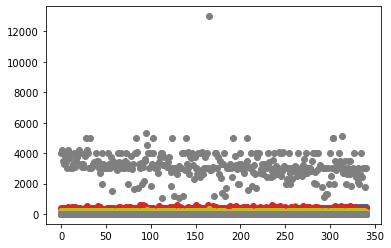

In [27]:
plt.plot(train_new,'o')
plt.show()

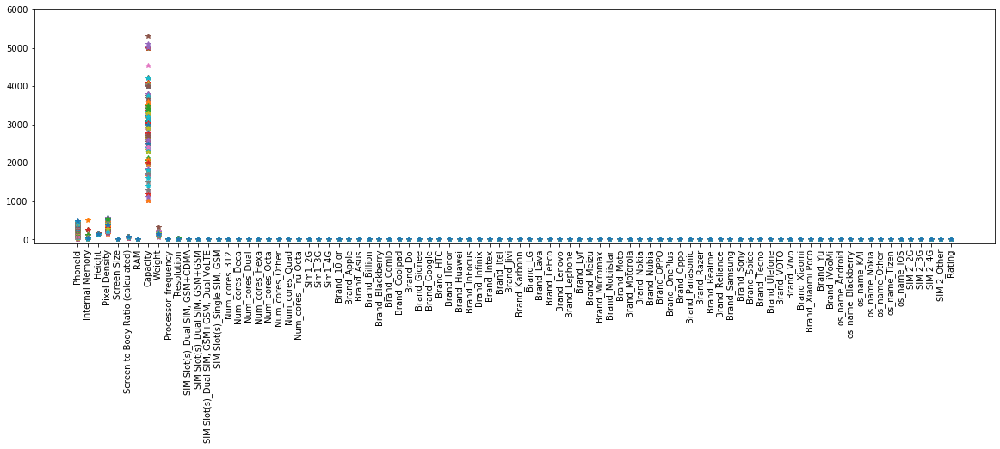

In [28]:
plt.figure(figsize=(20,5))
plt.plot(train_new.T,'*')
plt.ylim(-100,6000)
plt.xticks(rotation='vertical')
plt.show()

In [29]:
train_new['isLiked']=train_new['Rating'].map(lambda x: 0 if x<4.0 else 1)

In [30]:
print(train_new['isLiked'].value_counts())

1    238
0    103
Name: isLiked, dtype: int64


In [31]:
train_new.groupby('isLiked').mean()

,PhoneId,Internal Memory,Height,Pixel Density,Screen Size,Screen to Body Ratio (calculated),RAM,Capacity,Weight,Processor_frequency,Resolution,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,Sim1_2G,Sim1_3G,Sim1_4G,Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other,Rating
isLiked,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,299.485437,30.330097,146.980823,327.116505,5.163689,69.088544,2.68932,2984.805825,158.84466,1.568447,7.601942,0.000000,0.902913,0.038835,0.058252,0.000000,0.019417,0.038835,0.009709,0.436893,0.009709,0.485437,0.000000,0.009709,0.048544,0.941748,0.019417,0.000000,0.009709,0.0,0.038835,0.000000,0.019417,0.0,0.038835,0.000000,0.048544,0.019417,0.00000,0.029126,0.009709,0.038835,0.009709,0.009709,0.019417,0.058252,0.019417,0.000000,0.058252,0.009709,0.009709,0.000000,0.116505,0.029126,0.048544,0.000000,0.077670,0.009709,0.000000,0.000000,0.009709,0.019417,0.009709,0.000000,0.009709,0.058252,0.048544,0.0,0.009709,0.000000,0.009709,0.019417,0.019417,0.000000,0.029126,0.009709,0.932039,0.019417,0.019417,0.000000,0.019417,0.009709,0.000000,0.330097,0.029126,0.582524,0.058252,3.620388
1,204.184874,53.310924,151.229813,351.609244,5.591555,73.766261,3.47479,3280.676471,162.42437,1.889538,10.453782,0.004202,0.697479,0.201681,0.096639,0.004202,0.000000,0.025210,0.046218,0.642857,0.021008,0.256303,0.004202,0.025210,0.008403,0.966387,0.000000,0.079832,0.029412,0.0,0.004202,0.004202,0.000000,0.0,0.025210,0.016807,0.004202,0.063025,0.02521,0.000000,0.008403,0.000000,0.012605,0.000000,0.000000,0.012605,0.016807,0.004202,0.037815,0.000000,0.000000,0.008403,0.012605,0.004202,0.042017,0.008403,0.054622,0.000000,0.058824,0.012605,0.021008,0.008403,0.000000,0.016807,0.000000,0.159664,0.016807,0.0,0.029412,0.004202,0.000000,0.100840,0.079832,0.012605,0.004202,0.000000,0.894958,0.000000,0.000000,0.004202,0.021008,0.000000,0.079832,0.159664,0.016807,0.726891,0.096639,4.268067


In [32]:
X_train=train_new.drop('isLiked',axis=1)
X_train=X_train.drop('Rating',axis =1)
Y_train = train_new['isLiked']

In [33]:
X_train.head()

,PhoneId,Internal Memory,Height,Pixel Density,Screen Size,Screen to Body Ratio (calculated),RAM,Capacity,Weight,Processor_frequency,Resolution,"SIM Slot(s)_Dual SIM, GSM+CDMA","SIM Slot(s)_Dual SIM, GSM+GSM","SIM Slot(s)_Dual SIM, GSM+GSM, Dual VoLTE","SIM Slot(s)_Single SIM, GSM",Num_cores_312,Num_cores_Deca,Num_cores_Dual,Num_cores_Hexa,Num_cores_Octa,Num_cores_Other,Num_cores_Quad,Num_cores_Tru-Octa,Sim1_2G,Sim1_3G,Sim1_4G,Brand_10.or,Brand_Apple,Brand_Asus,Brand_Billion,Brand_Blackberry,Brand_Comio,Brand_Coolpad,Brand_Do,Brand_Gionee,Brand_Google,Brand_HTC,Brand_Honor,Brand_Huawei,Brand_InFocus,Brand_Infinix,Brand_Intex,Brand_Itel,Brand_Jivi,Brand_Karbonn,Brand_LG,Brand_Lava,Brand_LeEco,Brand_Lenovo,Brand_Lephone,Brand_Lyf,Brand_Meizu,Brand_Micromax,Brand_Mobiistar,Brand_Moto,Brand_Motorola,Brand_Nokia,Brand_Nubia,Brand_OPPO,Brand_OnePlus,Brand_Oppo,Brand_Panasonic,Brand_Razer,Brand_Realme,Brand_Reliance,Brand_Samsung,Brand_Sony,Brand_Spice,Brand_Tecno,Brand_Ulefone,Brand_VOTO,Brand_Vivo,Brand_Xiaomi,Brand_Xiaomi Poco,Brand_Yu,Brand_iVooMi,os_name_Android,os_name_Blackberry,os_name_KAI,os_name_Nokia,os_name_Other,os_name_Tizen,os_name_iOS,SIM 2_2G,SIM 2_3G,SIM 2_4G,SIM 2_Other
0,0,64,157.9,403,6.26,80.68,4,4000,182,1.8,20,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1,1,32,156.2,271,6.20,80.85,3,4230,168,1.8,8,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,2,32,157.0,409,6.30,83.68,3,3500,168,2.1,25,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
3,4,64,159.8,411,6.00,74.78,4,3300,169,2.2,24,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,5,64,160.4,396,6.50,84.23,4,3750,175,2.2,16,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


# DATA pre-Processing and Optimizing

In [34]:
def dataPreProcessing(X):
    X['Processor_frequency']=((X['Processor_frequency']-X['Processor_frequency'].min())/(X['Processor_frequency'].max()-X['Processor_frequency'].min()))
    X['Internal Memory']=((X['Internal Memory']-X['Internal Memory'].min())/(X['Internal Memory'].max()-X['Internal Memory'].min()))
    X['Weight']=((X['Weight']-X['Weight'].min())/(X['Weight'].max()-X['Weight'].min()))
    X['Screen Size']=((X['Screen Size']-X['Screen Size'].min())/(X['Screen Size'].max()-X['Screen Size'].min()))
    X['Height']=((X['Height']-X['Height'].min())/(X['Height'].max()-X['Height'].min()))
    X['Screen to Body Ratio (calculated)']=((X['Screen to Body Ratio (calculated)']-X['Screen to Body Ratio (calculated)'].min())/(X['Screen to Body Ratio (calculated)'].max()-X['Screen to Body Ratio (calculated)'].min()))
    X['RAM']=((X['RAM']-X['RAM'].min())/(X['RAM'].max()-X['RAM'].min()))
    X['Resolution']=((X['Resolution']-X['Resolution'].min())/(X['Resolution'].max()-X['Resolution'].min()))
    X['Capacity']=((X['Capacity']-X['Capacity'].min())/(X['Capacity'].max()-X['Capacity'].min()))
    X['Pixel Density']=((X['Pixel Density']-X['Pixel Density'].min())/(X['Pixel Density'].max()-X['Pixel Density'].min()))
    return X

In [35]:
X_train_Processed = dataPreProcessing(train_new)

In [36]:
X_train=X_train_Processed.drop('isLiked',axis=1)
X_train=X_train.drop('Rating',axis =1)
Y_train = X_train_Processed['isLiked']
print(X_train.shape)

(341, 87)


In [37]:
X_test =dataPreProcessing(test_new)

In [38]:
X_final_train=X_train.drop('PhoneId',axis=1)
Train_PhoneId = X_train['PhoneId']
X_final_test = X_test.drop('PhoneId',axis=1)
Test_PhoneId = X_test['PhoneId']

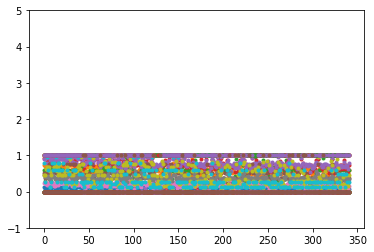

In [39]:
plt.plot(X_final_train,'.')
plt.ylim(-1,5)
plt.show()

In [40]:
print(X_final_train.shape,X_final_test.shape)

(341, 86) (119, 86)


In [41]:
X_final_train = X_final_train.values
X_final_test = X_final_test.values

# Perceptron CLass

In [42]:
from sklearn.metrics import accuracy_score

In [43]:
class Perceptron:
    def __init__(self):
        self.w = None
        self.b = None
    
    def model(self,x):
        return 1 if (np.dot(self.w, x) >= self.b) else 0

    def predict(self, X):
        Y = []
        for x in X:
            result = self.model(x)
            Y.append(result)
        return np.array(Y)

    def fit(self, X, Y, epochs=10, learning_rate = 1):
        self.w = np.ones(X.shape[1])
        self.b = 0
        accuracy = []
        max_accuracy = 0
        wt_matrix = []
        for i in range(epochs):
            for x,y in zip(X,Y):
                Y_pred = self.model(x)
                if y == 1 and Y_pred == 0:
                    self.w = self.w + learning_rate*x
                    self.b = self.b + learning_rate*1
                elif y == 0 and Y_pred == 1:
                    self.w = self.w - learning_rate*x
                    self.b = self.b - learning_rate*1
            temp = accuracy_score(self.predict(X),Y)
            accuracy.append(temp)
            wt_matrix.append(self.w)
            if (temp > max_accuracy):
                max_accuracy = temp
                checkptw = self.w
                checkptb = self.b
        self.w = checkptw
        self.b = checkptb
        plt.plot(accuracy)
        plt.ylim(-1,1)
        plt.show()
        return np.array(wt_matrix)
    def evolution(self):
        Y_pred_train = perceptron.predict(X_final_train)
        print("Training accuracy:\t",accuracy_score(Y_pred_train,Y_train))
        #Y_pred_test = perceptron.predict(X_test)
        #print("Testing accuracy:\t",accuracy_score(Y_pred_test,Y_test))
    



In [44]:
perceptron = Perceptron()

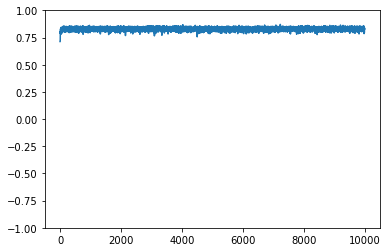

In [45]:
wt_matrix=perceptron.fit(X_final_train,Y_train,10000,0.1)

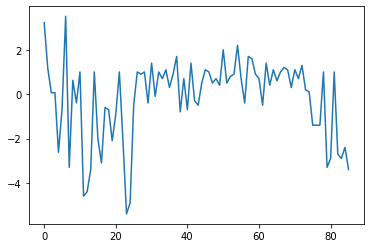

In [46]:
plt.plot(wt_matrix[-1,:])
plt.show()

In [47]:
perceptron.evolution()

Training accuracy:	 0.8709677419354839


In [48]:
Y_pred = perceptron.predict(X_final_train)

In [49]:
for x, y, z in zip(train_new['PhoneId'],Y_pred,train_new['isLiked']):
    print("PhoneID: {} {}, True: {}".format(x,y,z))

PhoneID: 0 1, True: 1
PhoneID: 1 1, True: 1
PhoneID: 2 1, True: 1
PhoneID: 4 1, True: 1
PhoneID: 5 1, True: 1
PhoneID: 7 1, True: 1
PhoneID: 8 1, True: 1
PhoneID: 9 1, True: 1
PhoneID: 10 1, True: 1
PhoneID: 12 1, True: 1
PhoneID: 14 1, True: 1
PhoneID: 15 1, True: 1
PhoneID: 17 1, True: 1
PhoneID: 18 1, True: 1
PhoneID: 20 1, True: 1
PhoneID: 21 1, True: 1
PhoneID: 22 1, True: 1
PhoneID: 23 1, True: 1
PhoneID: 26 1, True: 1
PhoneID: 28 1, True: 1
PhoneID: 30 1, True: 1
PhoneID: 31 1, True: 1
PhoneID: 33 1, True: 1
PhoneID: 34 1, True: 1
PhoneID: 36 1, True: 1
PhoneID: 37 1, True: 1
PhoneID: 38 1, True: 1
PhoneID: 42 1, True: 1
PhoneID: 44 1, True: 1
PhoneID: 45 1, True: 1
PhoneID: 47 1, True: 0
PhoneID: 48 1, True: 1
PhoneID: 49 1, True: 1
PhoneID: 50 1, True: 1
PhoneID: 51 1, True: 1
PhoneID: 52 1, True: 1
PhoneID: 53 1, True: 1
PhoneID: 54 1, True: 1
PhoneID: 55 1, True: 1
PhoneID: 56 0, True: 0
PhoneID: 57 1, True: 1
PhoneID: 58 1, True: 1
PhoneID: 59 1, True: 1
PhoneID: 60 1, True

In [50]:
Y_pred2 = perceptron.predict(X_final_test)

In [51]:
submission = pd.DataFrame({'PhoneId':test_new['PhoneId'], 'Class':Y_pred2})
submission = submission[['PhoneId', 'Class']]
submission.describe()

,PhoneId,Class
count,119.000000,119.00000
mean,240.176471,0.89916
std,136.804614,0.30239
min,3.000000,0.00000
25%,130.000000,1.00000
50%,245.000000,1.00000
75%,348.500000,1.00000
max,473.000000,1.00000


In [52]:
submission.head()

,PhoneId,Class
0,3,1
1,11,1
2,13,1
3,16,1
4,19,1


In [53]:
submission.to_csv("submission.csv", index=False)